# Multiparametric Imaging: CODEX

[![View on GitHub](https://img.shields.io/badge/View-on%20GitHub-lightgrey?logo=github)](https://github.com/Dana-Farber-AIOS/pathml/blob/master/examples/codex.ipynb)

In this tutorial, we will analyze the CODEX images provided by Schürch et. al: 
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7479520/.

Here, we will use PathML to process a large number of CODEX slides (140 slides) simultaneously through the SlideDataset class. We also show how the generated count matrices can be used to investigate the complex spatial architecture of the iTME in colorectal cancer. 

In [1]:
from os import listdir, path, getcwd
import glob
import re
import pandas as pd
from pathml.core import SlideDataset
from pathml.core.slide_data import VectraSlide
from pathml.core.slide_data import CODEXSlide
from pathml.preprocessing.pipeline import Pipeline
from pathml.preprocessing.transforms import SegmentMIF, QuantifyMIF, CollapseRunsCODEX
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from dask.distributed import Client, LocalCluster
from deepcell.utils.plot_utils import make_outline_overlay
from deepcell.utils.plot_utils import create_rgb_image
import scanpy as sc
import squidpy as sq
import anndata as ad
import bbknn
from joblib import parallel_backend

In /Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be re

In [2]:
# set working directory
%cd "~/Documents/Research/Projects/CRC_TMA"

/Users/mohamedomar/Documents/Research/Projects/CRC_TMA


In [3]:
## Read channel names
channelnames = pd.read_csv(
    "data/channelNames.txt", header=None, dtype=str, low_memory=False
)
channelnames

,0
0,HOECHST1
1,blank
2,blank
3,blank
4,HOECHST2
...,...
87,empty-Cy5-22
88,HOECHST23
89,empty-A488-23
90,empty-Cy3-23


## Reading the slides

In [21]:
dirpath = r"/Volumes/Mohamed/CRC"

# assuming that all slides are in a single directory, all with .tif file extension
for A, B in [listdir(dirpath)]:
    vectra_list_A = [
        CODEXSlide(p, stain="IF") for p in glob.glob(path.join(dirpath, A, "*.tif"))
    ]
    vectra_list_B = [
        CODEXSlide(p, stain="IF") for p in glob.glob(path.join(dirpath, B, "*.tif"))
    ]
    # Fix the slide names and add origin labels (A, B)
    for slide_A, slide_B in zip(vectra_list_A, vectra_list_B):
        slide_A.name = re.sub("X.*", "A", slide_A.name)
        slide_B.name = re.sub("X.*", "B", slide_B.name)
    # Store all slides in a SlideDataSet object
    dataset = SlideDataset(vectra_list_A + vectra_list_B)

## Define and run the preprocessing pipeline

In [8]:
# Here, we use DAPI (channel 0) and vimentin (channel 29) for segmentation
# Z=0 since we are processing images with a single slice (best focus)
pipe = Pipeline(
    [
        CollapseRunsCODEX(z=0),
        SegmentMIF(
            model="mesmer",
            nuclear_channel=0,
            cytoplasm_channel=29,
            image_resolution=0.377442,
        ),
        QuantifyMIF(segmentation_mask="cell_segmentation"),
    ]
)

# Initialize a dask cluster using 10 workers. PathML pipelines can be run in distributed mode on
# cloud compute or a cluster using dask.distributed.
cluster = LocalCluster(n_workers=10, threads_per_worker=1, processes=True)
client = Client(cluster)

# Run the pipeline
dataset.run(
    pipe, distributed=True, client=client, tile_size=(1920, 1440), tile_pad=False
)

# Write the processed datasets to disk
dataset.write("data/dataset_processed.h5")

## Extract and concatenate the resulting count matrices

 Combine the count matrices into a single adata object:

In [ ]:
##  Combine the count matrices into a single adata object:
adata = ad.concat(
    [x.counts for x in dataset.slides], join="outer", label="Region", index_unique="_"
)
# Fix and replace the regions names
origin = adata.obs["Region"]
origin = origin.astype(str).str.replace("[^a-zA-Z0-9 \n\.]", "")
origin = origin.astype(str).str.replace("[\n]", "")
origin = origin.str.replace("SlideDataname", "")
adata.obs["Region"] = origin

# save the adata object
adata_combined.write(filename="./data/adata_combined.h5ad")

In [6]:
# Rename the variable names (channels) in the adata object
adata.var_names = channelnames[0]
adata.var_names_make_unique()

Filter the cells using the DAPI and DRAQ5 intensity

/Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'coords' as categorical
/Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'slice' as categorical


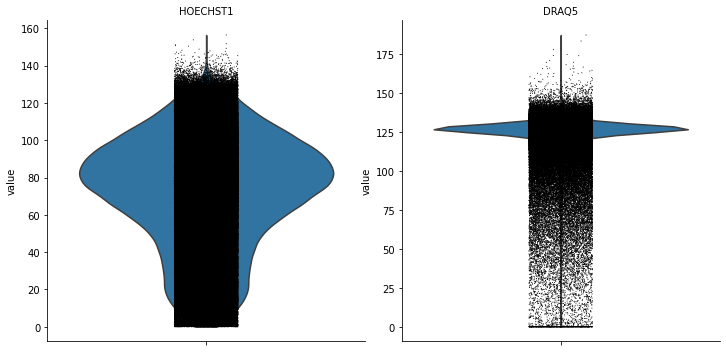

In [7]:
# Plot the DAPI intensity distribution:
sc.pl.violin(adata, keys=["HOECHST1", "DRAQ5"], multi_panel=True)

In [8]:
# Remove cells with low DAPI intensity (most likely artifacts)
adata = adata[adata[:, "HOECHST1"].X > 60, :]
adata = adata[adata[:, "DRAQ5"].X > 100, :]

In [9]:
# Remove the empty and nuclear channels
keep = [
    "CD44 - stroma",
    "FOXP3 - regulatory T cells",
    "CD8 - cytotoxic T cells",
    "p53 - tumor suppressor",
    "GATA3 - Th2 helper T cells",
    "CD45 - hematopoietic cells",
    "T-bet - Th1 cells",
    "beta-catenin - Wnt signaling",
    "HLA-DR - MHC-II",
    "PD-L1 - checkpoint",
    "Ki67 - proliferation",
    "CD45RA - naive T cells",
    "CD4 - T helper cells",
    "MUC-1 - epithelia",
    "CD30 - costimulator",
    "CD2 - T cells",
    "Vimentin - cytoplasm",
    "CD20 - B cells",
    "LAG-3 - checkpoint",
    "Na-K-ATPase - membranes",
    "CD5 - T cells",
    "IDO-1 - metabolism",
    "Cytokeratin - epithelia",
    "CD11b - macrophages",
    "CD56 - NK cells",
    "aSMA - smooth muscle",
    "BCL-2 - apoptosis",
    "CD25 - IL-2 Ra",
    "PD-1 - checkpoint",
    "Granzyme B - cytotoxicity",
    "EGFR - singling",
    "VISTA - costimulator",
    "CD15 - granulocytes",
    "ICOS - costimulator",
    "Synaptophysin - neuroendocrine",
    "GFAP - nerves",
    "CD7 - T cells",
    "CD3 - T cells",
    "Chromogranin A - neuroendocrine",
    "CD163 - macrophages",
    "CD45RO - memory cells",
    "CD68 - macrophages",
    "CD31 - vasculature",
    "Podoplanin - lymphatics",
    "CD34 - vasculature",
    "CD38 - multifunctional",
    "CD138 - plasma cells",
]
adata = adata[:, keep]

In [10]:
adata_combined

View of AnnData object with n_obs × n_vars = 272829 × 47
    obs: 'Region', 'coords', 'euler_number', 'filled_area', 'slice', 'tile', 'x', 'y', 'TMA'
    obsm: 'spatial'
    layers: 'max_intensity', 'min_intensity'

In [11]:
# Rename the markers
adata.var_names = [
    "CD44",
    "FOXP3",
    "CD8",
    "p53",
    "GATA3",
    "CD45",
    "T-bet",
    "beta-cat",
    "HLA-DR",
    "PD-L1",
    "Ki67",
    "CD45RA",
    "CD4",
    "MUC-1",
    "CD30",
    "CD2",
    "Vimentin",
    "CD20",
    "LAG-3",
    "Na-K-ATPase",
    "CD5",
    "IDO-1",
    "Cytokeratin",
    "CD11b",
    "CD56",
    "aSMA",
    "BCL-2",
    "CD25-IL-2Ra",
    "PD-1",
    "Granzyme B",
    "EGFR",
    "VISTA",
    "CD15",
    "ICOS",
    "Synaptophysin",
    "GFAP",
    "CD7",
    "CD3",
    "ChromograninA",
    "CD163",
    "CD45RO",
    "CD68",
    "CD31",
    "Podoplanin",
    "CD34",
    "CD38",
    "CD138",
]

In [12]:
# store the raw data for further use (differential expression or other analysis that uses raw counts)
adata.raw = adata

In [13]:
## Add patients and groups info:
# Annotation dict for patients (the public data does not provide an easy way to map samples to phenotypes)
regions_to_patients = dict(
    reg001_A="1",
    reg001_B="1",
    reg002_A="1",
    reg002_B="1",
    reg003_A="2",
    reg003_B="2",
    reg004_A="2",
    reg004_B="2",
    reg005_A="3",
    reg005_B="3",
    reg006_A="3",
    reg006_B="3",
    reg007_A="4",
    reg007_B="4",
    reg008_A="4",
    reg008_B="4",
    reg009_A="5",
    reg009_B="5",
    reg010_A="5",
    reg010_B="5",
    reg011_A="6",
    reg011_B="6",
    reg012_A="6",
    reg012_B="6",
    reg013_A="7",
    reg013_B="7",
    reg014_A="7",
    reg014_B="7",
    reg015_A="8",
    reg015_B="8",
    reg016_A="8",
    reg016_B="8",
    reg017_A="9",
    reg017_B="9",
    reg018_A="9",
    reg018_B="9",
    reg019_A="10",
    reg019_B="10",
    reg020_A="10",
    reg020_B="10",
    reg021_A="11",
    reg021_B="11",
    reg022_A="11",
    reg022_B="11",
    reg023_A="12",
    reg023_B="12",
    reg024_A="12",
    reg024_B="12",
    reg025_A="13",
    reg025_B="13",
    reg026_A="13",
    reg026_B="13",
    reg027_A="14",
    reg027_B="14",
    reg028_A="14",
    reg028_B="14",
    reg029_A="15",
    reg029_B="15",
    reg030_A="15",
    reg030_B="15",
    reg031_A="16",
    reg031_B="16",
    reg032_A="16",
    reg032_B="16",
    reg033_A="17",
    reg033_B="17",
    reg034_A="17",
    reg034_B="17",
    reg035_A="18",
    reg035_B="18",
    reg036_A="18",
    reg036_B="18",
    reg037_A="19",
    reg037_B="19",
    reg038_A="19",
    reg038_B="19",
    reg039_A="20",
    reg039_B="20",
    reg040_A="20",
    reg040_B="20",
    reg041_A="21",
    reg041_B="21",
    reg042_A="21",
    reg042_B="21",
    reg043_A="22",
    reg043_B="22",
    reg044_A="22",
    reg044_B="22",
    reg045_A="23",
    reg045_B="23",
    reg046_A="23",
    reg046_B="23",
    reg047_A="24",
    reg047_B="24",
    reg048_A="24",
    reg048_B="24",
    reg049_A="25",
    reg049_B="25",
    reg050_A="25",
    reg050_B="25",
    reg051_A="26",
    reg051_B="26",
    reg052_A="26",
    reg052_B="26",
    reg053_A="27",
    reg053_B="27",
    reg054_A="27",
    reg054_B="27",
    reg055_A="28",
    reg055_B="28",
    reg056_A="28",
    reg056_B="28",
    reg057_A="29",
    reg057_B="29",
    reg058_A="29",
    reg058_B="29",
    reg059_A="30",
    reg059_B="30",
    reg060_A="30",
    reg060_B="30",
    reg061_A="31",
    reg061_B="31",
    reg062_A="31",
    reg062_B="31",
    reg063_A="32",
    reg063_B="32",
    reg064_A="32",
    reg064_B="32",
    reg065_A="33",
    reg065_B="33",
    reg066_A="33",
    reg066_B="33",
    reg067_A="34",
    reg067_B="34",
    reg068_A="34",
    reg068_B="34",
    reg069_A="35",
    reg069_B="35",
    reg070_A="35",
    reg070_B="35",
)

Annotation dict for clinical groups: 
- CLR: Crohns like reaction
- DII: Diffuse inflammatory infiltrate

In [14]:
regions_to_groups = dict(
    reg001_A="CLR",
    reg001_B="CLR",
    reg002_A="CLR",
    reg002_B="CLR",
    reg003_A="DII",
    reg003_B="DII",
    reg004_A="DII",
    reg004_B="DII",
    reg005_A="DII",
    reg005_B="DII",
    reg006_A="DII",
    reg006_B="DII",
    reg007_A="DII",
    reg007_B="DII",
    reg008_A="DII",
    reg008_B="DII",
    reg009_A="DII",
    reg009_B="DII",
    reg010_A="DII",
    reg010_B="DII",
    reg011_A="CLR",
    reg011_B="CLR",
    reg012_A="CLR",
    reg012_B="CLR",
    reg013_A="DII",
    reg013_B="DII",
    reg014_A="DII",
    reg014_B="DII",
    reg015_A="DII",
    reg015_B="DII",
    reg016_A="DII",
    reg016_B="DII",
    reg017_A="DII",
    reg017_B="DII",
    reg018_A="DII",
    reg018_B="DII",
    reg019_A="CLR",
    reg019_B="CLR",
    reg020_A="CLR",
    reg020_B="CLR",
    reg021_A="CLR",
    reg021_B="CLR",
    reg022_A="CLR",
    reg022_B="CLR",
    reg023_A="CLR",
    reg023_B="CLR",
    reg024_A="CLR",
    reg024_B="CLR",
    reg025_A="CLR",
    reg025_B="CLR",
    reg026_A="CLR",
    reg026_B="CLR",
    reg027_A="DII",
    reg027_B="DII",
    reg028_A="DII",
    reg028_B="DII",
    reg029_A="DII",
    reg029_B="DII",
    reg030_A="DII",
    reg030_B="DII",
    reg031_A="DII",
    reg031_B="DII",
    reg032_A="DII",
    reg032_B="DII",
    reg033_A="CLR",
    reg033_B="CLR",
    reg034_A="CLR",
    reg034_B="CLR",
    reg035_A="DII",
    reg035_B="DII",
    reg036_A="DII",
    reg036_B="DII",
    reg037_A="CLR",
    reg037_B="CLR",
    reg038_A="CLR",
    reg038_B="CLR",
    reg039_A="CLR",
    reg039_B="CLR",
    reg040_A="CLR",
    reg040_B="CLR",
    reg041_A="CLR",
    reg041_B="CLR",
    reg042_A="CLR",
    reg042_B="CLR",
    reg043_A="DII",
    reg043_B="DII",
    reg044_A="DII",
    reg044_B="DII",
    reg045_A="DII",
    reg045_B="DII",
    reg046_A="DII",
    reg046_B="DII",
    reg047_A="CLR",
    reg047_B="CLR",
    reg048_A="CLR",
    reg048_B="CLR",
    reg049_A="DII",
    reg049_B="DII",
    reg050_A="DII",
    reg050_B="DII",
    reg051_A="DII",
    reg051_B="DII",
    reg052_A="DII",
    reg052_B="DII",
    reg053_A="DII",
    reg053_B="DII",
    reg054_A="DII",
    reg054_B="DII",
    reg055_A="CLR",
    reg055_B="CLR",
    reg056_A="CLR",
    reg056_B="CLR",
    reg057_A="CLR",
    reg057_B="CLR",
    reg058_A="CLR",
    reg058_B="CLR",
    reg059_A="DII",
    reg059_B="DII",
    reg060_A="DII",
    reg060_B="DII",
    reg061_A="DII",
    reg061_B="DII",
    reg062_A="DII",
    reg062_B="DII",
    reg063_A="CLR",
    reg063_B="CLR",
    reg064_A="CLR",
    reg064_B="CLR",
    reg065_A="CLR",
    reg065_B="CLR",
    reg066_A="CLR",
    reg066_B="CLR",
    reg067_A="CLR",
    reg067_B="CLR",
    reg068_A="CLR",
    reg068_B="CLR",
    reg069_A="CLR",
    reg069_B="CLR",
    reg070_A="CLR",
    reg070_B="CLR",
)

In [15]:
# map each slide to its source patient and clinical group (CLR vs DII)
adata.obs["patients"] = adata.obs["Region"].map(regions_to_patients).astype("category")

adata.obs["groups"] = adata.obs["Region"].map(regions_to_groups).astype("category")

In [18]:
# log transform and scale the data
sc.pp.log1p(adata)
sc.pp.scale(adata, max_value=10)

In [19]:
# PCA and batch correction using Harmony
sc.tl.pca(adata)
sc.external.pp.harmony_integrate(adata, key="Region")

2021-08-14 23:23:40,665 - harmonypy - INFO - Iteration 1 of 10
2021-08-14 23:26:19,392 - harmonypy - INFO - Iteration 2 of 10
2021-08-14 23:29:16,153 - harmonypy - INFO - Iteration 3 of 10
2021-08-14 23:32:22,647 - harmonypy - INFO - Converged after 3 iterations


In [20]:
# save for future use
adata.write(filename="./data/adata_harmony.h5ad")

In [21]:
# Compute neighbors and UMAP embedding
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30, use_rep="X_pca_harmony")
sc.tl.umap(adata)

In [22]:
# louvain clustering
with parallel_backend("threading", n_jobs=15):
    sc.tl.louvain(adata, resolution=3)

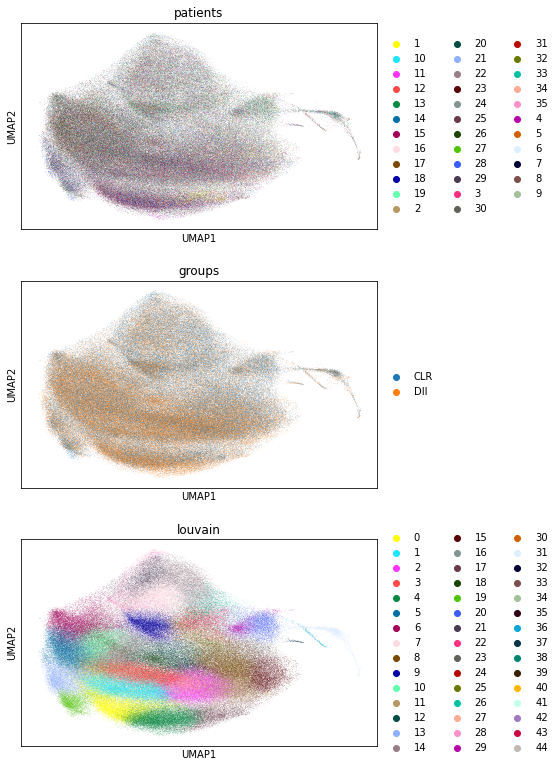

In [26]:
# Plot UMAP
sc.pl.umap(adata, color=["patients", "groups", "louvain"], ncols=1)

## Annotate the clusters based on the markers intensity
Here, we define a function for cell annotation which takes as input the processed adata object together with a set of thresholds for each marker/channel.
The function annotates the cells based on the specified thresholds and return the annotated adata object with the cell coordinates. 

In [27]:
def phenotype(adata, annot_dict):
    """
    Given a dict of dicts including phenotypes and marker gene thresholds, phenotype cells.

    Args:
        adata : the anndata object.
        annot_dict (dict): annotation dictionary each key is a cell type of interest and
            its value is a dictionary indicating protein expression ranges for that cell type.
            Each value should be a tuple (min, max) containing the minimum and maximum thresholds.
    """

    # Get the count matrix
    data = adata.copy()
    countMat = data.to_df()

    # Annotate the cell types
    for label in annot_dict.keys():
        for key, value in annot_dict[label].items():
            cond = np.logical_and.reduce(
                [
                    (
                        (countMat[k] >= countMat[k].quantile(list(v)[0]))
                        & (countMat[k] <= countMat[k].quantile(list(v)[1]))
                    )
                    for k, v in annot_dict[label].items()
                ]
            )
            data.obs.loc[cond, "cell_types"] = label
            # replace nan with unknown
            data.obs.cell_types.fillna("unknown", inplace=True)

    return data

In [30]:
annot_dict = {
    "CD3+ T lymphocytes": {"CD3": (0.85, 1.0), "CD4": (0.0, 0.50), "CD8": (0.00, 0.50)},
    "CD4+ T lymphocytes": {
        "CD3": (0.50, 1.0),
        "CD4": (0.50, 1.0),
        "CD8": (0.0, 0.75),
        "CD45RO": (0.0, 0.75),
    },
    "CD8+ T lymphocytes": {"CD3": (0.50, 1), "CD8": (0.50, 1), "CD4": (0.0, 0.75)},
    "CD4+CD45RO+ T cells": {
        "CD3": (0.50, 1),
        "CD8": (0.0, 0.75),
        "CD4": (0.50, 1),
        "CD45RO": (0.50, 1),
    },
    "Tregs": {
        "CD3": (0.50, 1.0),
        "CD25-IL-2Ra": (0.75, 1),
        "FOXP3": (0.75, 1),
        "CD8": (0.0, 0.50),
    },
    "B cells": {"CD20": (0.50, 1), "CD3": (0.0, 0.75)},
    "plasma cells": {"CD38": (0.50, 1), "CD20": (0.50, 1), "CD3": (0.0, 0.75)},
    "granulocytes": {"CD15": (0.50, 1), "CD11b": (0.50, 1), "CD3": (0.0, 0.85)},
    "CD68+ macrophages": {"CD68": (0.95, 1), "CD3": (0.0, 0.50), "CD163": (0.0, 0.95)},
    "CD163+ macrophages": {"CD163": (0.95, 1), "CD3": (0.0, 0.50), "CD68": (0.0, 0.50)},
    "CD68+CD163 macrophages": {
        "CD68": (0.50, 1),
        "CD163": (0.50, 1),
        "CD3": (0.0, 0.95),
    },
    "CD11b+CD68+ macrophages": {
        "CD68": (0.95, 1),
        "CD11b": (0.50, 1),
        "CD3": (0.0, 0.50),
    },
    "NK cells": {"CD56": (0.75, 1), "CD3": (0.0, 0.50), "Cytokeratin": (0.0, 0.50)},
    "vasculature": {"CD34": (0.50, 1), "CD31": (0.50, 1), "Cytokeratin": (0.0, 0.50)},
    "tumor cells": {"Cytokeratin": (0.50, 1), "p53": (0.50, 1), "aSMA": (0.0, 0.75)},
    "immune cells": {
        "CD20": (0.50, 1),
        "CD38": (0.50, 1),
        "CD3": (0.50, 1),
        "GFAP": (0.50, 1),
        "CD15": (0.50, 1),
        "Cytokeratin": (0.0, 0.50),
        "aSMA": (0.0, 0.75),
    },
    "tumor/immune": {
        "CD20": (0.50, 1),
        "CD3": (0.75, 1),
        "CD38": (0.50, 1),
        "GFAP": (0.80, 1),
        "Cytokeratin": (0.85, 1),
        "p53": (0.50, 1),
        "aSMA": (0.0, 0.75),
    },
    "vascular/immune": {
        "CD20": (0.50, 1),
        "CD3": (0.85, 1),
        "CD38": (0.50, 1),
        "GFAP": (0.80, 1),
        "CD34": (0.75, 1),
        "CD31": (0.75, 1),
        "aSMA": (0.0, 0.75),
    },
    "stromal cells": {"Vimentin": (0.50, 1), "Cytokeratin": (0.0, 0.50)},
    "Adipocytes": {
        "p53": (0.75, 1),
        "Vimentin": (0.75, 1),
        "Cytokeratin": (0.0, 0.50),
        "aSMA": (0.0, 0.50),
        "CD44": (0.0, 0.50),
    },
    "smooth muscles": {"aSMA": (0.70, 1), "Vimentin": (0.50, 1), "CD3": (0.0, 0.50)},
    "nerves": {
        "Synaptophysin": (0.85, 1),
        "Vimentin": (0.50, 1),
        "GFAP": (0.85, 1),
        "CD3": (0.0, 0.50),
    },
    "lymphatics": {"Podoplanin": (0.99, 1), "CD3": (0.0, 0.75)},
    "artifact": {
        "CD20": (0.0, 0.50),
        "CD3": (0.0, 0.50),
        "CD38": (0.0, 0.50),
        "GFAP": (0.0, 0.50),
        "Cytokeratin": (0.0, 0.50),
        "p53": (0.0, 0.50),
        "aSMA": (0.0, 0.50),
        "CD15": (0.0, 0.50),
        "CD68": (0.0, 0.50),
        "CD25-IL-2Ra": (0.0, 0.50),
        "CD34": (0.0, 0.50),
        "CD31": (0.0, 0.50),
        "CD56": (0.0, 0.50),
        "Vimentin": (0.0, 0.50),
    },
}

In [31]:
# Annotate the adata
adata_annot = process_adata(adata, annot_dict=annot_dict)
adata_annot.obs.cell_types.value_counts()

unknown                    42834
tumor cells                37035
stromal cells              31646
CD68+CD163 macrophages     28479
granulocytes               23164
vasculature                20016
smooth muscles             19990
B cells                    13433
CD8+ T lymphocytes         10962
plasma cells                8911
CD4+CD45RO+ T cells         6603
artifact                    4650
CD4+ T lymphocytes          4395
vascular/immune             4004
CD3+ T lymphocytes          3975
immune cells                3075
Adipocytes                  2825
tumor/immune                1925
CD68+ macrophages           1431
Tregs                       1067
CD11b+CD68+ macrophages      869
lymphatics                   865
nerves                       366
CD163+ macrophages           220
NK cells                      89
Name: cell_types, dtype: int64

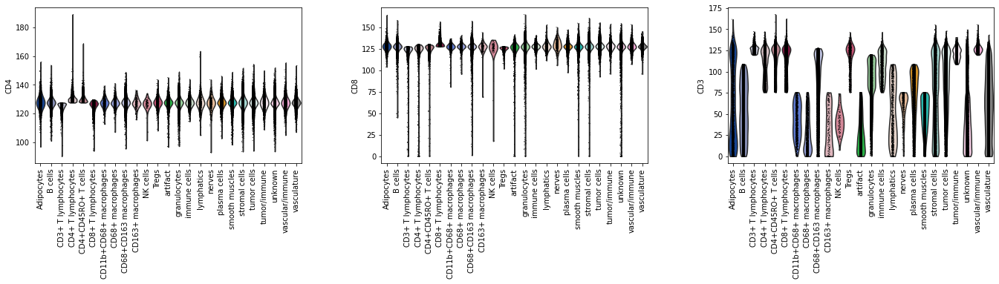

In [33]:
sc.pl.violin(adata_annot, groupby="cell_types", keys=["CD4", "CD8", "CD3"], rotation=90)

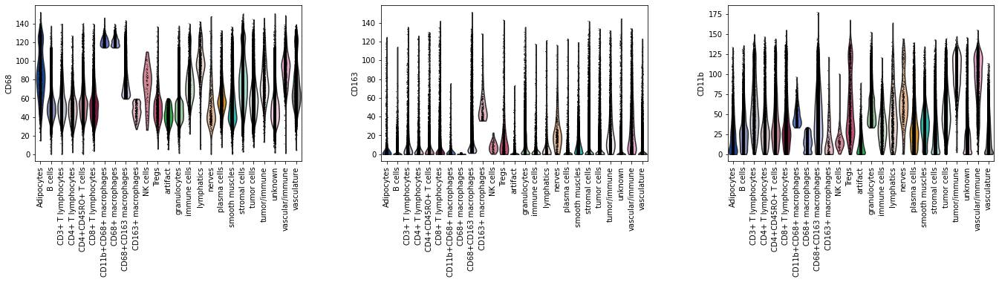

In [35]:
sc.pl.violin(
    adata_annot, groupby="cell_types", keys=["CD68", "CD163", "CD11b"], rotation=90
)

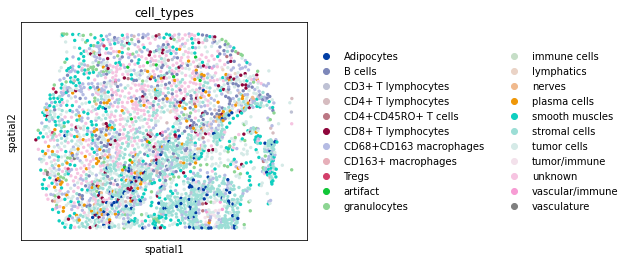

In [36]:
sc.pl.spatial(
    adata_annot[adata_annot.obs.Region == "reg020_A"],
    color="cell_types",
    spot_size=25,
    size=1,
)

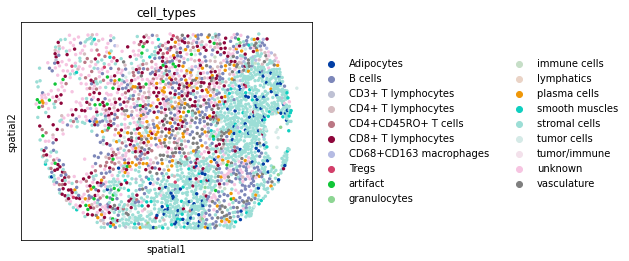

In [37]:
sc.pl.spatial(
    adata_annot[adata_annot.obs.Region == "reg020_B"],
    color="cell_types",
    spot_size=25,
    size=1,
)

######################################################

In [39]:
# Put in a dataframe for further analysis
countData = adata_annot.to_df()
obs = adata_annot.obs
data = pd.concat([countData, obs], axis = 1)
data['CellID'] = Data.index\# Remove the cells with unknown annotation and the artifacts
data = data.loc[~Data['cell_types'].isin(['unknown'])]
data = data.loc[~Data['cell_types'].isin(['artifact'])]
data['cell_types'] = data['cell_types'].cat.remove_unused_categories()
data['cell_types'] = data['cell_types'].astype('str')

In [44]:
data.shape

(225345, 61)

In [45]:
# save
data.to_csv("./data/CRC_pathml.csv")

##########################################

## Identification of cellular neighborhoods

After identifying cell types, the next step is to identify cellular neighborhoods using the same approach described in Schürch et. al. and utilizing the code available from: https://github.com/nolanlab/NeighborhoodCoordination

In summary, for each cell, we are going to idenify the 10 nearest spatial neighbors (windows), then we are going to cluster these windows into distinct neighborhoods based on their cell type composition.

In [46]:
from sklearn.neighbors import NearestNeighbors
import time
import sys
from sklearn.cluster import MiniBatchKMeans
import seaborn as sns

In [47]:
# Function for identifying the windows
def get_windows(job, n_neighbors):
    """
    For each region and each individual cell in dataset, return the indices of the nearest neighbors.

    'job:  meta data containing the start time,index of region, region name, indices of region in original dataframe
    n_neighbors:  the number of neighbors to find for each cell
    """
    start_time, idx, tissue_name, indices = job
    job_start = time.time()

    print("Starting:", str(idx + 1) + "/" + str(len(exps)), ": " + exps[idx])

    # tissue_group: a grouped data frame with X and Y coordinates grouped by unique tissue regions
    tissue = tissue_group.get_group(tissue_name)

    to_fit = tissue.loc[indices][["x", "y"]].values

    # Unsupervised learner for implementing neighbor searches.
    fit = NearestNeighbors(n_neighbors=n_neighbors).fit(tissue[["x", "y"]].values)

    # Find the nearest neighbors

    m = fit.kneighbors(to_fit)

    m = m[0], m[1]

    ## sort_neighbors
    args = m[0].argsort(axis=1)

    add = np.arange(m[1].shape[0]) * m[1].shape[1]

    sorted_indices = m[1].flatten()[args + add[:, None]]

    neighbors = tissue.index.values[sorted_indices]

    end_time = time.time()

    print(
        "Finishing:",
        str(idx + 1) + "/" + str(len(exps)),
        ": " + exps[idx],
        end_time - job_start,
        end_time - start_time,
    )
    return neighbors.astype(np.int32)

In [48]:
data = pd.read_csv("./data/CRC_pathml.csv")

In [49]:
# make dummy variables
data = pd.concat([Data, pd.get_dummies(Data["cell_types"])], axis=1)
# Extract the cell types with dummy variables
sum_cols = data["cell_types"].unique()
values = data[sum_cols].values

find windows for each cell in each tissue region

In [51]:
# Keep the X and Y coordianates + the tissue regions >> then group by tissue regions (140 unique regions)
tissue_group = data[["x", "y", "Region"]].groupby("Region")

# Create a list of unique tissue regions
exps = list(data["Region"].unique())

# time.time(): current time is seconds
# indices: a list of indices (rownames) of each dataframe in tissue_group
# exps.index(t) : t represents the index of each one of the indices eg, exps.index("reg001_A") is 0 and exps.index("reg001_B") is 1 and so on
# t is the name of tissue regions eg, reg001_A
tissue_chunks = [
    (time.time(), exps.index(t), t, a)
    for t, indices in tissue_group.groups.items()
    for a in np.array_split(indices, 1)
]

# Get the window (the 10 closest cells to each cell in each tissue region)
tissues = [get_windows(job, 10) for job in tissue_chunks]

Starting: 61/140 : reg001_A
Finishing: 61/140 : reg001_A 0.009814977645874023 0.022227048873901367
Starting: 77/140 : reg001_B
Finishing: 77/140 : reg001_B 0.004416942596435547 0.026772260665893555
Starting: 19/140 : reg002_A
Finishing: 19/140 : reg002_A 0.006669044494628906 0.0336461067199707
Starting: 101/140 : reg002_B
Finishing: 101/140 : reg002_B 0.0061969757080078125 0.04012012481689453
Starting: 58/140 : reg003_A
Finishing: 58/140 : reg003_A 0.005404233932495117 0.045838117599487305
Starting: 85/140 : reg003_B
Finishing: 85/140 : reg003_B 0.002471923828125 0.04852771759033203
Starting: 65/140 : reg004_A
Finishing: 65/140 : reg004_A 0.005899906158447266 0.054521799087524414
Starting: 71/140 : reg004_B
Finishing: 71/140 : reg004_B 0.0063402652740478516 0.06109809875488281
Starting: 40/140 : reg005_A
Finishing: 40/140 : reg005_A 0.0077631473541259766 0.0690910816192627
Starting: 105/140 : reg005_B
Finishing: 105/140 : reg005_B 0.005625247955322266 0.07496023178100586
Starting: 8/14

################################

for each cell and its nearest neighbors, reshape and count the number of each cell type in those neighbors.

In [52]:
ks = [10]
out_dict = {}
for k in ks:
    for neighbors, job in zip(tissues, tissue_chunks):
        chunk = np.arange(len(neighbors))  # indices
        tissue_name = job[2]
        indices = job[3]
        window = (
            values[neighbors[chunk, :k].flatten()]
            .reshape(len(chunk), k, len(sum_cols))
            .sum(axis=1)
        )
        out_dict[(tissue_name, k)] = (window.astype(np.float16), indices)

concatenate the summed windows and combine into one dataframe for each window size tested.

In [53]:
keep_cols = ["x", "y", "Region", "cell_types"]
windows = {}
for k in ks:
    window = pd.concat(
        [
            pd.DataFrame(
                out_dict[(exp, k)][0],
                index=out_dict[(exp, k)][1].astype(int),
                columns=sum_cols,
            )
            for exp in exps
        ],
        0,
    )
    window = window.loc[Data.index.values]
    window = pd.concat([Data[keep_cols], window], 1)
    windows[k] = window

<ipython-input-53-dbc25edfe709>:4: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  window = pd.concat(
<ipython-input-53-dbc25edfe709>:8: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  window = pd.concat([Data[keep_cols], window], 1)


In [54]:
neighborhood_name = "neighborhood" + str(k)
k_centroids = {}

windows2 = windows[10]

Clustering the windows

In [64]:
km = MiniBatchKMeans(n_clusters=10, random_state=0)

labelskm = km.fit_predict(windows2[sum_cols].values)
k_centroids[10] = km.cluster_centers_
data["neighborhood10"] = labelskm
data[neighborhood_name] = data[neighborhood_name].astype("category")

In [65]:
cell_order = [
    "tumor cells",
    "CD68+CD163 macrophages",
    "CD11b+CD68+ macrophages",
    "CD68+ macrophages",
    "CD163+ macrophages",
    "granulocytes",
    "NK cells",
    "CD3+ T lymphocytes",
    "CD4+ T lymphocytes",
    "CD4+CD45RO+ T cells",
    "CD8+ T lymphocytes",
    "Tregs",
    "B cells",
    "plasma cells",
    "tumor/immune",
    "vascular/immune",
    "immune cells",
    "smooth muscles",
    "stromal cells",
    "vasculature",
    "lymphatics",
    "nerves",
]

This plot shows the cell types abundance in the different niches

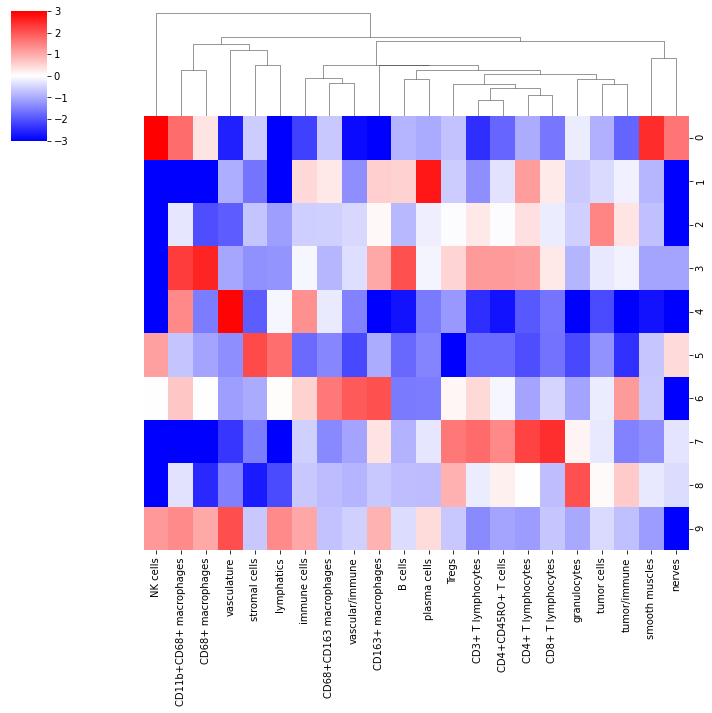

In [66]:
niche_clusters = k_centroids[10]
tissue_avgs = values.mean(axis=0)
fc = np.log2(
    (
        (niche_clusters + tissue_avgs)
        / (niche_clusters + tissue_avgs).sum(axis=1, keepdims=True)
    )
    / tissue_avgs
)
fc = pd.DataFrame(fc, columns=sum_cols)
s = sns.clustermap(
    fc.loc[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9], cell_order],
    vmin=-3,
    vmax=3,
    cmap="bwr",
    row_cluster=False,
)

Visualize the identified neighborhoods on the slides in each clinical group

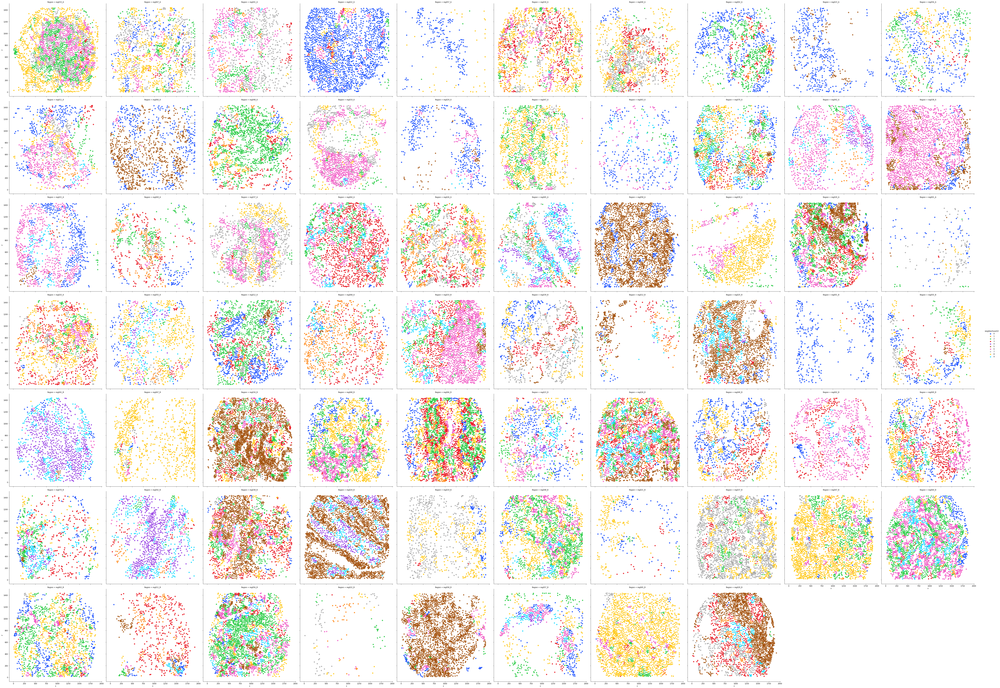

In [67]:
# CLR
Data["neighborhood10"] = Data["neighborhood10"].astype("category")
sns.lmplot(
    data=Data[Data["groups"] == "CLR"],
    x="x",
    y="y",
    hue="neighborhood10",
    palette="bright",
    height=8,
    col="Region",
    col_wrap=10,
    fit_reg=False,
)

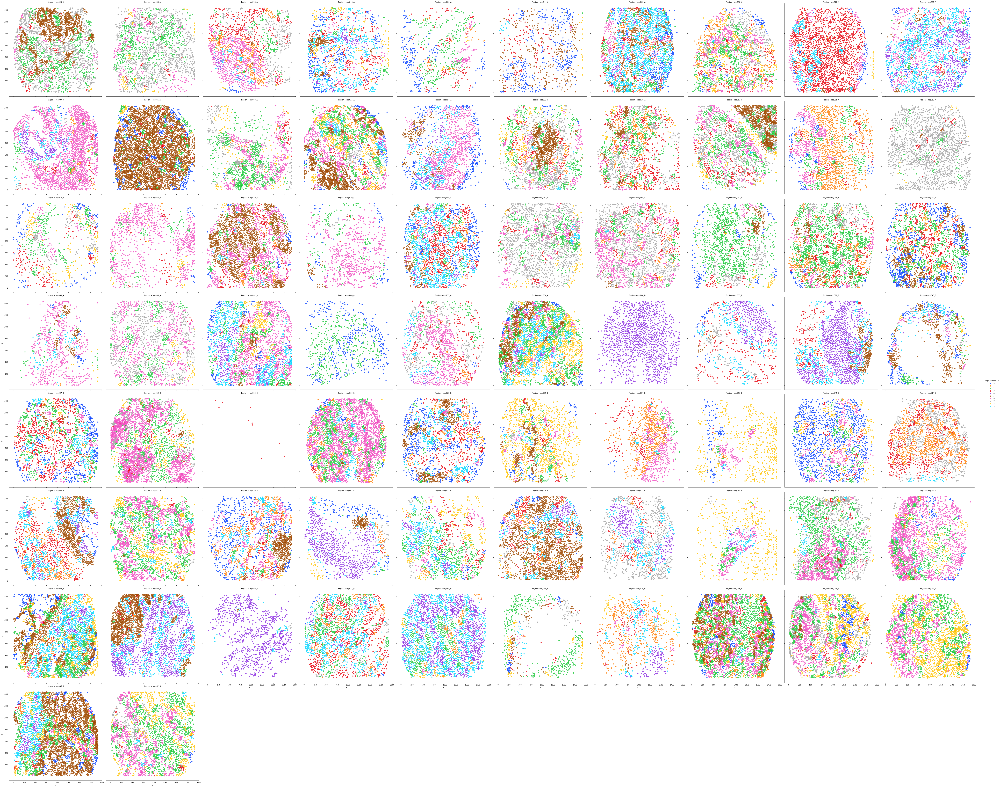

In [68]:
# DII
Data["neighborhood10"] = Data["neighborhood10"].astype("category")
sns.lmplot(
    data=Data[Data["groups"] == "DII"],
    x="x",
    y="y",
    hue="neighborhood10",
    palette="bright",
    height=8,
    col="Region",
    col_wrap=10,
    fit_reg=False,
)

Plot for each group and each patient the percent of total cells allocated to each neighborhood

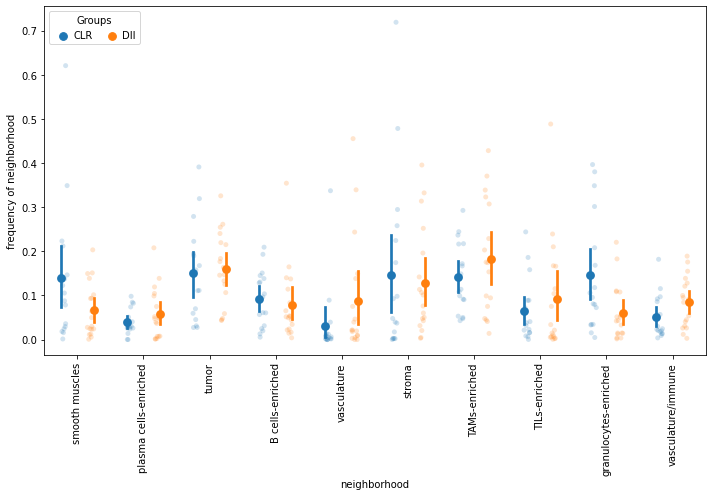

In [70]:
fc = Data.groupby(["patients", "groups"]).apply(
    lambda x: x["neighborhood10"].value_counts(sort=False, normalize=True)
)

fc.columns = range(10)
melt = pd.melt(fc.reset_index(), id_vars=["patients", "groups"])
melt = melt.rename(
    columns={"variable": "neighborhood", "value": "frequency of neighborhood"}
)
melt["neighborhood"] = melt["neighborhood"].map(
    {
        0: "smooth muscles",
        1: "plasma cells-enriched",
        2: "tumor",
        3: "B cells-enriched",
        4: "vasculature",
        5: "stroma",
        6: "TAMs-enriched",
        7: "TILs-enriched",
        8: "granulocytes-enriched",
        9: "vasculature/immune",
    }
)

f, ax = plt.subplots(figsize=(10, 7))
sns.stripplot(
    data=melt,
    hue="groups",
    dodge=True,
    alpha=0.2,
    x="neighborhood",
    y="frequency of neighborhood",
)
sns.pointplot(
    data=melt,
    scatter_kws={"marker": "d"},
    hue="groups",
    dodge=0.5,
    join=False,
    x="neighborhood",
    y="frequency of neighborhood",
)
handles, labels = ax.get_legend_handles_labels()
plt.xticks(rotation=90, fontsize="10", ha="center")
ax.legend(
    handles[:2],
    labels[:2],
    title="Groups",
    handletextpad=0,
    columnspacing=1,
    loc="upper left",
    ncol=3,
    frameon=True,
)
plt.tight_layout()